In [1]:
import os
import zipfile
import pandas as pd
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define paths (MODIFY THESE TO MATCH YOUR ACTUAL FILE PATHS)
drive_root = '/content/drive/MyDrive/'  # Adjust if your files are in a subfolder
train_zip_path = os.path.join(drive_root, 'training_set.zip')
train_csv_path = os.path.join(drive_root, 'training_set_pixel_size_and_HC.csv')

# Verify files exist
print("Checking if files exist...")
print(f"Train zip exists: {os.path.exists(train_zip_path)}")
print(f"Train CSV exists: {os.path.exists(train_csv_path)}")

# Create directories
base_dir = '/content/data'
os.makedirs(base_dir, exist_ok=True)

train_dir = os.path.join(base_dir, 'train')
train_images_dir = os.path.join(train_dir, 'images')
train_masks_dir = os.path.join(train_dir, 'masks')

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_masks_dir, exist_ok=True)

# Extract training data
print("\nExtracting training data...")
try:
    with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
        zip_ref.extractall(train_dir)
    print("Training data extracted successfully!")
    print("Contents of train directory:")
    print(os.listdir(train_dir))
except Exception as e:
    print(f"Error extracting training data: {e}")

# Load CSV file
print("\nLoading CSV file...")
try:
    train_csv = pd.read_csv(train_csv_path)
    print("Training CSV loaded successfully!")
    print(f"Found {len(train_csv)} entries in training CSV")
except Exception as e:
    print(f"Error loading training CSV: {e}")
    train_csv = None

# Organize files with more robust checking
print("\nOrganizing files...")

def find_files(directory, pattern):
    """Find all files in directory matching pattern"""
    matches = []
    for root, _, files in os.walk(directory):
        for f in files:
            if f.endswith(pattern):
                matches.append(os.path.join(root, f))
    return matches

# Find all PNGs in train directory
train_pngs = find_files(train_dir, '.png')
print(f"Found {len(train_pngs)} PNG files in train directory")

# Move files to appropriate folders
moved_images = 0
moved_masks = 0

for filepath in train_pngs:
    filename = os.path.basename(filepath)
    try:
        if '_Annotation' in filename:
            new_path = os.path.join(train_masks_dir, filename)
            os.rename(filepath, new_path)
            moved_masks += 1
        else:
            new_path = os.path.join(train_images_dir, filename)
            os.rename(filepath, new_path)
            moved_images += 1
    except Exception as e:
        print(f"Error moving {filename}: {e}")

print(f"Moved {moved_images} images to {train_images_dir}")
print(f"Moved {moved_masks} masks to {train_masks_dir}")

# Final verification
print("\nFinal verification:")
print(f"Training images: {len(os.listdir(train_images_dir))}")
print(f"Training masks: {len(os.listdir(train_masks_dir))}")

if train_csv is not None:
    print("\nSample training CSV data:")
    print(train_csv.head())


Mounted at /content/drive
Checking if files exist...
Train zip exists: True
Train CSV exists: True

Extracting training data...
Training data extracted successfully!
Contents of train directory:
['masks', 'images', 'training_set']

Loading CSV file...
Training CSV loaded successfully!
Found 999 entries in training CSV

Organizing files...
Found 1998 PNG files in train directory
Moved 999 images to /content/data/train/images
Moved 999 masks to /content/data/train/masks

Final verification:
Training images: 999
Training masks: 999

Sample training CSV data:
     filename  pixel size(mm)  head circumference (mm)
0  000_HC.png        0.069136                    44.30
1  001_HC.png        0.089659                    56.81
2  002_HC.png        0.062033                    68.75
3  003_HC.png        0.091291                    69.00
4  004_HC.png        0.061240                    59.81


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.5 MB/s eta 0:00:00
Found 999 images and 999 masks

Sample 1:
Image: 000_HC.png
Mask: 000_HC_Annotation.png


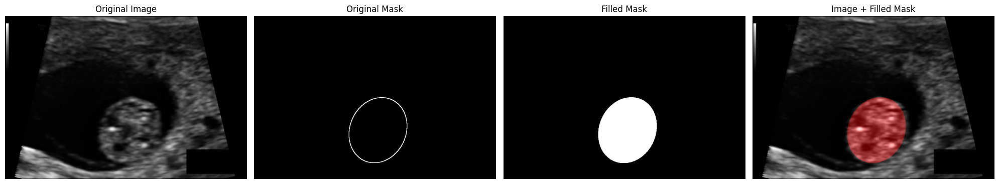


Sample 2:
Image: 001_HC.png
Mask: 001_HC_Annotation.png


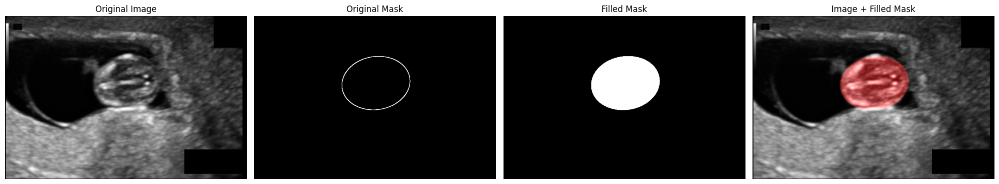


Sample 3:
Image: 002_HC.png
Mask: 002_HC_Annotation.png


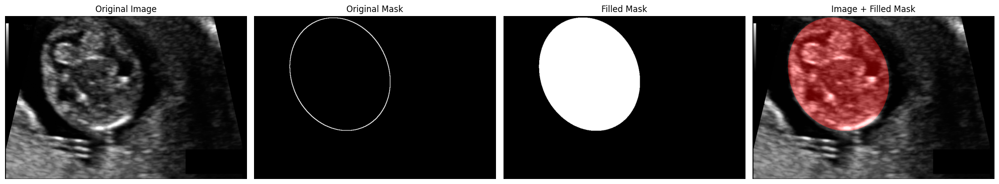

In [2]:
!pip install opencv-python-headless --quiet
!pip install segmentation-models-pytorch --quiet
!pip install albumentations --quiet


import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from glob import glob

# Set paths (modify if needed)
train_images_dir = '/content/data/train/images'
train_masks_dir = '/content/data/train/masks'

# Get sample images and masks
image_files = sorted(glob(os.path.join(train_images_dir, '*.png')))
mask_files = sorted(glob(os.path.join(train_masks_dir, '*_Annotation.png')))

# Verify we have matching pairs
if len(image_files) == 0 or len(mask_files) == 0:
    print("No images or masks found! Check your paths:")
    print(f"Images path: {train_images_dir}")
    print(f"Masks path: {train_masks_dir}")
else:
    print(f"Found {len(image_files)} images and {len(mask_files)} masks")

# Function to fill holes in a binary mask
def fill_holes(mask):
    """Fill holes in a binary mask using morphological closing and contour filling."""
    # Ensure mask is binary (0 or 255)
    _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    # Find contours and fill them
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, contours, -1, 255, thickness=cv2.FILLED)

    # Alternatively, use morphological closing (kernel size may need adjustment)
    # kernel = np.ones((5, 5), np.uint8)
    # filled_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    return filled_mask

# Display function (now includes hole-filling)
def display_image_with_mask(image_path, mask_path, alpha=0.4):
    """Display image with mask overlay (after filling holes in the mask)."""
    # Read images
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if image is None or mask is None:
        print(f"Could not read {image_path} or {mask_path}")
        return

    # Fill holes in the mask
    filled_mask = fill_holes(mask)

    # Create colored mask (red in this case)
    colored_mask = np.zeros((*filled_mask.shape, 3), dtype=np.uint8)
    colored_mask[filled_mask > 0] = [255, 0, 0]  # Red color

    # Convert grayscale image to RGB for visualization
    image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Overlay mask
    overlayed = cv2.addWeighted(image_rgb, 1, colored_mask, alpha, 0)

    # Create figure
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # Now with 4 subplots

    # Display original image
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display original mask (before filling holes)
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title('Original Mask')
    axes[1].axis('off')

    # Display filled mask (after processing)
    axes[2].imshow(filled_mask, cmap='gray')
    axes[2].set_title('Filled Mask')
    axes[2].axis('off')

    # Display overlay
    axes[3].imshow(overlayed)
    axes[3].set_title('Image + Filled Mask')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# Display first few samples
num_samples = min(3, len(image_files))
for i in range(num_samples):
    print(f"\nSample {i+1}:")
    print(f"Image: {os.path.basename(image_files[i])}")
    print(f"Mask: {os.path.basename(mask_files[i])}")
    display_image_with_mask(image_files[i], mask_files[i])

In [3]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from skimage import exposure
import albumentations as A
from sklearn.model_selection import train_test_split
from collections import defaultdict
import matplotlib.pyplot as plt
from glob import glob

# Configuration for 256x256 images
class Config:
    TARGET_SIZE = (256, 256)
    INPUT_IMAGES_DIR = '/content/data/train/images'
    INPUT_MASKS_DIR = '/content/data/train/masks'
    OUTPUT_DIR = '/content/data/split_preprocessed_256'

    AUGMENT = True
    NUM_AUGMENTATIONS = 5
    TEST_SIZE = 0.2
    VAL_SIZE = 0.2
    RANDOM_STATE = 42

# Create output directories
for subset in ['train', 'val', 'test']:
    for data_type in ['images', 'masks']:
        os.makedirs(os.path.join(Config.OUTPUT_DIR, subset, data_type), exist_ok=True)

class DataPreprocessor:
    def __init__(self):
        self.class_stats = defaultdict(list)
        self.augmentation_pipeline = self._create_augmentation_pipeline()

    def _create_augmentation_pipeline(self):
        """Create augmentation pipeline with foreground preservation"""
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.Rotate(limit=30, p=0.5, interpolation=cv2.INTER_NEAREST),
            A.ShiftScaleRotate(
                shift_limit=0.05,
                scale_limit=0.1,
                rotate_limit=20,
                p=0.5,
                interpolation=cv2.INTER_NEAREST
            ),
            A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
            A.CLAHE(clip_limit=3.0, p=0.3),
            A.GaussNoise(var_limit=5.0, p=0.1),
            A.OneOf([
                A.ElasticTransform(alpha=0.3, sigma=15, alpha_affine=8, p=0.2, interpolation=cv2.INTER_NEAREST),
                A.GridDistortion(num_steps=2, distort_limit=0.08, p=0.2, interpolation=cv2.INTER_NEAREST),
            ], p=0.3),
        ], additional_targets={'mask': 'mask'})

    def _fill_holes(self, mask):
        """Fill holes in a binary mask using contour filling."""
        _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        filled_mask = np.zeros_like(binary_mask)
        cv2.drawContours(filled_mask, contours, -1, 255, thickness=cv2.FILLED)
        return filled_mask

    def _enhance_foreground(self, image, mask):
        """Apply techniques to enhance visibility of rare foreground."""
        if np.mean(mask) < 0.01:
            fg_pixels = image[mask > 0]
            if len(fg_pixels) > 5:
                p2, p98 = np.percentile(fg_pixels, (2, 98))
                if p98 - p2 > 3:
                    image = exposure.rescale_intensity(image, in_range=(p2, p98), out_range=(0, 255)).astype(np.uint8)
            gamma = np.clip(0.6 + np.random.rand()*0.3, 0.6, 0.9)
            image = exposure.adjust_gamma(image, gamma=gamma)
            if np.random.rand() > 0.7:
                kernel = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]]) / 10.0
                fg_regions = cv2.bitwise_and(image, image, mask=mask.astype(np.uint8))
                sharpened = cv2.filter2D(fg_regions, -1, kernel)
                image = cv2.addWeighted(image, 0.85, sharpened, 0.15, 0)
                image = np.clip(image, 0, 255)
        return image, mask

    def process_dataset(self):
        """Process and split the dataset."""
        image_files = sorted(glob(os.path.join(Config.INPUT_IMAGES_DIR, '*.png')))
        mask_files = sorted(glob(os.path.join(Config.INPUT_MASKS_DIR, '*.png')))

        data_pairs = list(zip(image_files, mask_files))
        train_pairs, test_pairs = train_test_split(data_pairs, test_size=Config.TEST_SIZE, random_state=Config.RANDOM_STATE)
        train_pairs, val_pairs = train_test_split(train_pairs, test_size=Config.VAL_SIZE / (1 - Config.TEST_SIZE), random_state=Config.RANDOM_STATE)

        self._process_subset(train_pairs, 'train')
        self._process_subset(val_pairs, 'val')
        self._process_subset(test_pairs, 'test')

    def _process_subset(self, pairs, subset):
        """Process and save a subset (train, val, or test)."""
        for image_path, mask_path in tqdm(pairs, desc=f"Processing {subset}"):
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Fill holes in the mask before processing
            mask = self._fill_holes(mask)

            # Resize to target size
            image = cv2.resize(image, Config.TARGET_SIZE, interpolation=cv2.INTER_AREA)
            mask = cv2.resize(mask, Config.TARGET_SIZE, interpolation=cv2.INTER_NEAREST)

            # Enhance foreground (if enabled)
            image, mask = self._enhance_foreground(image, mask)

            # Data augmentation (if enabled)
            if Config.AUGMENT and subset == 'train':
                for i in range(Config.NUM_AUGMENTATIONS):
                    augmented = self.augmentation_pipeline(image=image, mask=mask)
                    self._save_image_mask_pair(augmented['image'], augmented['mask'], subset, image_path, mask_path, is_augmented=True)

            # Save original (and augmented if applicable) image and mask
            self._save_image_mask_pair(image, mask, subset, image_path, mask_path)

    def _save_image_mask_pair(self, image, mask, subset, image_path, mask_path, is_augmented=False):
        """Save image and mask to the appropriate directory."""
        filename_base = os.path.splitext(os.path.basename(image_path))[0]
        if is_augmented:
            filename_base += f"_aug_{i}"

        image_output_path = os.path.join(Config.OUTPUT_DIR, subset, 'images', f"{filename_base}.png")
        mask_output_path = os.path.join(Config.OUTPUT_DIR, subset, 'masks', f"{filename_base}.png")

        cv2.imwrite(image_output_path, image)
        cv2.imwrite(mask_output_path, mask)

if __name__ == "__main__":
    preprocessor = DataPreprocessor()
    preprocessor.process_dataset()

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-3-2142060390.py:50: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=5.0, p=0.1),
/tmp/ipython-input-3-2142060390.py:52: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=0.3, sigma=15, alpha_affine=8, p=0.2, interpolation=cv2.INTER_NEAREST),
Processing test: 100%|██████████| 200/200 [00:02<00:00, 90.00it/s]


In [4]:
!pip install segmentation-models-pytorch --quiet
!pip install albumentations --quiet


Using device: cuda
Model Parameters: 6.47M
Starting training...


Epoch 1/30: 100%|██████████| 599/599 [00:56<00:00, 10.64it/s]



Epoch 1: Loss: 0.6823, Val Dice: 0.9708
Saved best model with Dice: 0.9708


Epoch 2/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 2: Loss: 0.6274, Val Dice: 0.9720
Saved best model with Dice: 0.9720


Epoch 3/30: 100%|██████████| 599/599 [00:54<00:00, 10.90it/s]



Epoch 3: Loss: 0.6161, Val Dice: 0.9751
Saved best model with Dice: 0.9751


Epoch 4/30: 100%|██████████| 599/599 [00:54<00:00, 11.04it/s]



Epoch 4: Loss: 0.6098, Val Dice: 0.9783
Saved best model with Dice: 0.9783


Epoch 5/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 5: Loss: 0.6098, Val Dice: 0.9782


Epoch 6/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 6: Loss: 0.6210, Val Dice: 0.9660


Epoch 7/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 7: Loss: 0.6148, Val Dice: 0.9767


Epoch 8/30: 100%|██████████| 599/599 [00:53<00:00, 11.13it/s]



Epoch 8: Loss: 0.6061, Val Dice: 0.9791
Saved best model with Dice: 0.9791


Epoch 9/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 9: Loss: 0.6079, Val Dice: 0.9806
Saved best model with Dice: 0.9806


Epoch 10/30: 100%|██████████| 599/599 [00:53<00:00, 11.17it/s]



Epoch 10: Loss: 0.6075, Val Dice: 0.9818
Saved best model with Dice: 0.9818


Epoch 11/30: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 11: Loss: 0.6081, Val Dice: 0.9820
Saved best model with Dice: 0.9820


Epoch 12/30: 100%|██████████| 599/599 [00:54<00:00, 10.97it/s]



Epoch 12: Loss: 0.6087, Val Dice: 0.9845
Saved best model with Dice: 0.9845


Epoch 13/30: 100%|██████████| 599/599 [00:54<00:00, 11.06it/s]



Epoch 13: Loss: 0.6074, Val Dice: 0.9807


Epoch 14/30: 100%|██████████| 599/599 [00:53<00:00, 11.10it/s]



Epoch 14: Loss: 0.6083, Val Dice: 0.9786


Epoch 15/30: 100%|██████████| 599/599 [00:53<00:00, 11.11it/s]



Epoch 15: Loss: 0.6035, Val Dice: 0.9814


Epoch 16/30: 100%|██████████| 599/599 [00:53<00:00, 11.14it/s]



Epoch 16: Loss: 0.6040, Val Dice: 0.9812


Epoch 17/30: 100%|██████████| 599/599 [00:54<00:00, 11.05it/s]



Epoch 17: Loss: 0.6068, Val Dice: 0.9801


Epoch 18/30: 100%|██████████| 599/599 [00:53<00:00, 11.12it/s]



Epoch 18: Loss: 0.6053, Val Dice: 0.9831


Epoch 19/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 19: Loss: 0.6050, Val Dice: 0.9838


Epoch 20/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 20: Loss: 0.6055, Val Dice: 0.9747


Epoch 21/30: 100%|██████████| 599/599 [00:53<00:00, 11.13it/s]



Epoch 21: Loss: 0.6057, Val Dice: 0.9820


Epoch 22/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 22: Loss: 0.6042, Val Dice: 0.9834


Epoch 23/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 23: Loss: 0.6037, Val Dice: 0.9831


Epoch 24/30: 100%|██████████| 599/599 [00:53<00:00, 11.11it/s]



Epoch 24: Loss: 0.6033, Val Dice: 0.9761


Epoch 25/30: 100%|██████████| 599/599 [00:54<00:00, 11.03it/s]



Epoch 25: Loss: 0.6049, Val Dice: 0.9836


Epoch 26/30: 100%|██████████| 599/599 [00:54<00:00, 11.05it/s]



Epoch 26: Loss: 0.6027, Val Dice: 0.9846
Saved best model with Dice: 0.9846


Epoch 27/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 27: Loss: 0.6031, Val Dice: 0.9818


Epoch 28/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 28: Loss: 0.6030, Val Dice: 0.9857
Saved best model with Dice: 0.9857


Epoch 29/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 29: Loss: 0.6021, Val Dice: 0.9881
Saved best model with Dice: 0.9881


Epoch 30/30: 100%|██████████| 599/599 [00:53<00:00, 11.10it/s]



Epoch 30: Loss: 0.6034, Val Dice: 0.9850


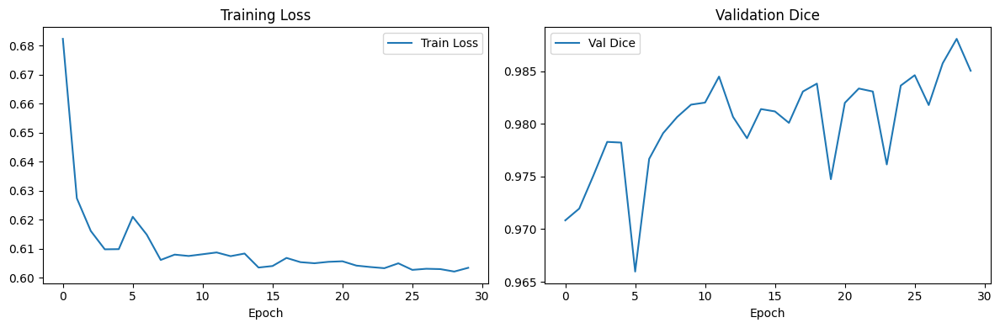

In [19]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import math
from einops import rearrange

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Configuration
data_path = "/content/data/split_preprocessed_256"
model_save_path = "/content/drive/MyDrive/best_medsegdiff_model.pth"
batch_size = 2
img_size = 256
epochs = 30
noise_steps = 500

# Dataset implementation
class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = A.Compose([
            A.Resize(img_size, img_size),
            A.HorizontalFlip(p=0.5),
            A.Normalize(mean=(0.5,), std=(0.5,)),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        if image.ndim == 2:
            image = np.expand_dims(image, axis=-1)

        transformed = self.transform(image=image, mask=mask)
        image = transformed["image"].float()
        mask = transformed["mask"].float().unsqueeze(0) / 255.0

        return image, mask

def get_data_loaders():
    splits = ["train", "val", "test"]
    loaders = {}

    for split in splits:
        image_dir = os.path.join(data_path, split, "images")
        mask_dir = os.path.join(data_path, split, "masks")

        image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')])
        mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.png')])

        dataset = SegmentationDataset(image_paths, mask_paths)
        loaders[split] = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=(split == "train"),
            num_workers=2,
            pin_memory=True
        )

    return loaders['train'], loaders['val'], loaders['test']

# Model Components
class TimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
        half_dim = dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, dtype=torch.float) * -emb)
        self.register_buffer('emb', emb)

    def forward(self, time):
        emb = time.float()[:, None] * self.emb[None, :]  # [batch_size, half_dim]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)  # [batch_size, dim]
        return emb

class AnchorSA(nn.Module):
    def __init__(self, channels, kernel_size=3):
        super().__init__()
        self.gaussian = nn.Conv2d(channels, channels, kernel_size,
                                padding=kernel_size//2,
                                groups=channels, bias=False)
        # Initialize as Gaussian kernel
        weights = torch.FloatTensor([[1, 2, 1],
                                    [2, 4, 2],
                                    [1, 2, 1]]) / 16.0
        with torch.no_grad():
            for i in range(channels):
                self.gaussian.weight[i] = weights
        self.gaussian.weight.requires_grad_(True)

    def forward(self, x_encoder, feat_cond):
        anchor = torch.max(self.gaussian(feat_cond), feat_cond)
        # Add .contiguous() calls
        return x_encoder.contiguous() + anchor.contiguous()

class SSFormerBlock(nn.Module):
    def __init__(self, d_model, n_heads):
        super().__init__()
        self.norm = nn.LayerNorm(d_model)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_model*4),
            nn.GELU(),
            nn.Linear(d_model*4, d_model),
        )

    def forward(self, noisy_emb, sem_emb):
        q = self.norm(noisy_emb)
        k = self.norm(sem_emb)
        v = sem_emb
        attn_out, _ = self.cross_attn(q, k, v)
        return noisy_emb + self.ff(attn_out)

class SSFormer(nn.Module):
    def __init__(self, d_model, n_heads, num_layers):
        super().__init__()
        self.layers = nn.ModuleList([SSFormerBlock(d_model, n_heads) for _ in range(num_layers)])

    def forward(self, noisy_emb, sem_emb):
        for layer in self.layers:
            noisy_emb = layer(noisy_emb, sem_emb)
        return noisy_emb

class ConditionModel(nn.Module):
    def __init__(self, in_channels=1, base_channels=32):
        super().__init__()
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU(),
            nn.Conv2d(base_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU()
        )
        self.down1 = nn.Conv2d(base_channels, base_channels*2, 2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )
        self.down2 = nn.Conv2d(base_channels*2, base_channels*4, 2, stride=2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU()
        )

        # Decoder for embedding
        self.up1 = nn.ConvTranspose2d(base_channels*8, base_channels*4, 2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(base_channels*8, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU(),
            nn.Conv2d(base_channels*4, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU()
        )

        self.up2 = nn.ConvTranspose2d(base_channels*4, base_channels*2, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )

    def encode(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.down1(x1))
        x3 = self.bottleneck(self.down2(x2))
        return [x1, x2, x3]

    def decode_to_embedding(self, feats):
        x1, x2, x3 = feats
        x = self.up1(x3)
        x = torch.cat([x, x2], dim=1)
        x = self.dec1(x)
        x = self.up2(x)
        x = torch.cat([x, x1], dim=1)
        x = self.dec2(x)
        return x

class DownBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.down = nn.Conv2d(out_ch, out_ch, 2, stride=2)

    def forward(self, x, t):
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        h = self.conv2(h)
        return self.down(h), h

class UpBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.up = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)
        self.conv1 = nn.Sequential(
            nn.Conv2d(out_ch*2, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )

    def forward(self, x, skip, t):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        return self.conv2(h)

class MedSegDiffV2UNet(nn.Module):
    def __init__(self, img_size=256, in_channels=1, base_channels=32,
                 time_dim=128, n_heads=4, ss_layers=3):
        super().__init__()
        self.time_embed = nn.Sequential(
            TimeEmbedding(time_dim),
            nn.Linear(time_dim, time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim),
        )

        self.cond_model = ConditionModel(in_channels, base_channels)

        # Diffusion U-Net Encoder
        self.enc1 = DownBlock(in_channels, base_channels, time_dim)
        self.enc2 = DownBlock(base_channels, base_channels*2, time_dim)
        self.enc3 = DownBlock(base_channels*2, base_channels*4, time_dim)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU()
        )

        # Anchor-SA and SS-Former
        self.anchor_sa = AnchorSA(base_channels*8)
        self.ssformer = SSFormer(base_channels*8, n_heads, ss_layers)

        # Downsampling for conditioning features to match diffusion bottleneck spatial size
        self.cond_downsample = nn.Conv2d(base_channels*8, base_channels*8, 2, stride=2)


        # Diffusion U-Net Decoder
        self.up1 = UpBlock(base_channels*8, base_channels*4, time_dim)
        self.up2 = UpBlock(base_channels*4, base_channels*2, time_dim)
        self.up3 = UpBlock(base_channels*2, base_channels, time_dim)

        self.out_conv = nn.Conv2d(base_channels, in_channels, 1)

    def forward(self, noisy_mask, image, timestep):
        # Time embedding
        t = self.time_embed(timestep)

        # 1. Extract image features
        cond_feats = self.cond_model.encode(image)
        # Get the conditioning feature from the ConditionModel's bottleneck (spatial size img_size/4, channels base_channels*8)
        cond_bottleneck_feat = cond_feats[-1]

        # Downsample the conditioning feature to match the diffusion bottleneck spatial size (img_size/8)
        conditioned_features = self.cond_downsample(cond_bottleneck_feat)

        # Sem_emb for SSFormer. Use the downsampled bottleneck feature.
        sem_emb = conditioned_features


        # 2. Encode mask
        x, skip1 = self.enc1(noisy_mask, t)
        x, skip2 = self.enc2(x, t)
        x, skip3 = self.enc3(x, t)
        x = self.bottleneck(x)

        # 3. Anchor Condition
        x = self.anchor_sa(x, conditioned_features)

        # 4. Semantic Condition via SS-Former
        B, C, H, W = x.shape
        x = rearrange(x, 'b c h w -> b (h w) c')
        sem_emb_for_ssformer = rearrange(sem_emb, 'b c h w -> b (h w) c')
        x = self.ssformer(x, sem_emb_for_ssformer)
        x = rearrange(x, 'b (h w) c -> b c h w', h=H, w=W)


        # 5. Decode to predict noise
        x = self.up1(x, skip3, t)
        x = self.up2(x, skip2, t)
        x = self.up3(x, skip1, t)

        return self.out_conv(x)

class Diffusion:
    def __init__(self):
        self.noise_steps = noise_steps
        beta = torch.linspace(1e-4, 0.02, noise_steps).to(device)
        self.alpha = 1 - beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

    def noise_images(self, x, t):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        Ɛ = torch.randn_like(x)
        return sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * Ɛ, Ɛ

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,)).to(device)

class HybridLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()
        dice = 1 - (2. * intersection) / (union + 1e-8)
        return self.bce(pred, target) + dice

def calculate_metrics(pred, target):
    pred = (torch.sigmoid(pred) > 0.5).float()
    target = target.float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    dice = (2. * intersection) / (union + 1e-8)
    iou = intersection / (union - intersection + 1e-8)
    acc = (pred == target).float().mean()
    return dice.item(), iou.item(), acc.item()

def train_model(model, diffusion, train_loader, val_loader):
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
    criterion = HybridLoss()

    best_dice = 0
    history = {'train_loss': [], 'val_dice': []}

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, masks = images.to(device), masks.to(device)

            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)

            optimizer.zero_grad()
            outputs = model(noisy_masks, images, t)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # Validation
        model.eval()
        val_dice = 0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                t = diffusion.sample_timesteps(images.shape[0])
                noisy_masks, _ = diffusion.noise_images(masks, t)
                outputs = model(noisy_masks, images, t)
                dice, _, _ = calculate_metrics(outputs, masks)
                val_dice += dice

        train_loss = epoch_loss / len(train_loader)
        val_dice /= len(val_loader)
        history['train_loss'].append(train_loss)
        history['val_dice'].append(val_dice)

        print(f"\nEpoch {epoch+1}: Loss: {train_loss:.4f}, Val Dice: {val_dice:.4f}")

        if val_dice > best_dice:
            best_dice = val_dice
            torch.save(model.state_dict(), model_save_path)
            print(f"Saved best model with Dice: {best_dice:.4f}")

    return history

# Main Execution
if __name__ == "__main__":
    # Get data loaders
    train_loader, val_loader, test_loader = get_data_loaders()

    # Initialize model and diffusion
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    diffusion = Diffusion()

    print(f"Model Parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M")
    print("Starting training...")

    # Train the model
    history = train_model(model, diffusion, train_loader, val_loader)

    # Plot results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history['val_dice'], label='Val Dice')
    plt.title('Validation Dice')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

Using device: cuda
Model Parameters: 6.47M
Starting training...


Epoch 1/30: 100%|██████████| 599/599 [00:54<00:00, 10.91it/s]



Epoch 1:
Train - Loss: 0.7065, Dice: 0.9357, IoU: 0.8892
Val - Dice: 0.9420, IoU: 0.8968
Saved best model with Val Dice: 0.9420


Epoch 2/30: 100%|██████████| 599/599 [00:54<00:00, 11.06it/s]



Epoch 2:
Train - Loss: 0.6585, Dice: 0.9408, IoU: 0.8959
Val - Dice: 0.9542, IoU: 0.9172
Saved best model with Val Dice: 0.9542


Epoch 3/30: 100%|██████████| 599/599 [00:54<00:00, 11.04it/s]



Epoch 3:
Train - Loss: 0.6504, Dice: 0.9464, IoU: 0.9044
Val - Dice: 0.9539, IoU: 0.9163


Epoch 4/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 4:
Train - Loss: 0.6339, Dice: 0.9587, IoU: 0.9250
Val - Dice: 0.9636, IoU: 0.9342
Saved best model with Val Dice: 0.9636


Epoch 5/30: 100%|██████████| 599/599 [00:54<00:00, 11.05it/s]



Epoch 5:
Train - Loss: 0.6416, Dice: 0.9519, IoU: 0.9134
Val - Dice: 0.9517, IoU: 0.9138


Epoch 6/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 6:
Train - Loss: 0.6376, Dice: 0.9550, IoU: 0.9198
Val - Dice: 0.9449, IoU: 0.9037


Epoch 7/30: 100%|██████████| 599/599 [00:53<00:00, 11.13it/s]



Epoch 7:
Train - Loss: 0.6307, Dice: 0.9608, IoU: 0.9278
Val - Dice: 0.9601, IoU: 0.9287


Epoch 8/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 8:
Train - Loss: 0.6140, Dice: 0.9739, IoU: 0.9510
Val - Dice: 0.9761, IoU: 0.9546
Saved best model with Val Dice: 0.9761


Epoch 9/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 9:
Train - Loss: 0.6158, Dice: 0.9723, IoU: 0.9478
Val - Dice: 0.9585, IoU: 0.9262


Epoch 10/30: 100%|██████████| 599/599 [00:53<00:00, 11.12it/s]



Epoch 10:
Train - Loss: 0.6155, Dice: 0.9726, IoU: 0.9484
Val - Dice: 0.9741, IoU: 0.9513


Epoch 11/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 11:
Train - Loss: 0.6167, Dice: 0.9717, IoU: 0.9470
Val - Dice: 0.9771, IoU: 0.9563
Saved best model with Val Dice: 0.9771


Epoch 12/30: 100%|██████████| 599/599 [00:53<00:00, 11.12it/s]



Epoch 12:
Train - Loss: 0.6114, Dice: 0.9758, IoU: 0.9540
Val - Dice: 0.9774, IoU: 0.9571
Saved best model with Val Dice: 0.9774


Epoch 13/30: 100%|██████████| 599/599 [00:53<00:00, 11.14it/s]



Epoch 13:
Train - Loss: 0.6140, Dice: 0.9737, IoU: 0.9502
Val - Dice: 0.9810, IoU: 0.9635
Saved best model with Val Dice: 0.9810


Epoch 14/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 14:
Train - Loss: 0.6065, Dice: 0.9793, IoU: 0.9608
Val - Dice: 0.9700, IoU: 0.9446


Epoch 15/30: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 15:
Train - Loss: 0.6052, Dice: 0.9806, IoU: 0.9629
Val - Dice: 0.9762, IoU: 0.9553


Epoch 16/30: 100%|██████████| 599/599 [00:53<00:00, 11.16it/s]



Epoch 16:
Train - Loss: 0.6074, Dice: 0.9786, IoU: 0.9596
Val - Dice: 0.9815, IoU: 0.9642
Saved best model with Val Dice: 0.9815


Epoch 17/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 17:
Train - Loss: 0.6064, Dice: 0.9796, IoU: 0.9611
Val - Dice: 0.9821, IoU: 0.9652
Saved best model with Val Dice: 0.9821


Epoch 18/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 18:
Train - Loss: 0.6092, Dice: 0.9773, IoU: 0.9573
Val - Dice: 0.9828, IoU: 0.9667
Saved best model with Val Dice: 0.9828


Epoch 19/30: 100%|██████████| 599/599 [00:54<00:00, 11.08it/s]



Epoch 19:
Train - Loss: 0.6060, Dice: 0.9797, IoU: 0.9616
Val - Dice: 0.9831, IoU: 0.9674
Saved best model with Val Dice: 0.9831


Epoch 20/30: 100%|██████████| 599/599 [00:53<00:00, 11.11it/s]



Epoch 20:
Train - Loss: 0.6036, Dice: 0.9817, IoU: 0.9648
Val - Dice: 0.9657, IoU: 0.9358


Epoch 21/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 21:
Train - Loss: 0.6046, Dice: 0.9811, IoU: 0.9634
Val - Dice: 0.9852, IoU: 0.9713
Saved best model with Val Dice: 0.9852


Epoch 22/30: 100%|██████████| 599/599 [00:54<00:00, 11.07it/s]



Epoch 22:
Train - Loss: 0.6043, Dice: 0.9811, IoU: 0.9638
Val - Dice: 0.9833, IoU: 0.9676


Epoch 23/30: 100%|██████████| 599/599 [00:53<00:00, 11.13it/s]



Epoch 23:
Train - Loss: 0.6025, Dice: 0.9826, IoU: 0.9664
Val - Dice: 0.9692, IoU: 0.9412


Epoch 24/30: 100%|██████████| 599/599 [00:53<00:00, 11.12it/s]



Epoch 24:
Train - Loss: 0.6043, Dice: 0.9812, IoU: 0.9637
Val - Dice: 0.9836, IoU: 0.9682


Epoch 25/30: 100%|██████████| 599/599 [00:54<00:00, 11.09it/s]



Epoch 25:
Train - Loss: 0.6055, Dice: 0.9803, IoU: 0.9623
Val - Dice: 0.9846, IoU: 0.9700


Epoch 26/30: 100%|██████████| 599/599 [00:53<00:00, 11.15it/s]



Epoch 26:
Train - Loss: 0.6034, Dice: 0.9818, IoU: 0.9651
Val - Dice: 0.9806, IoU: 0.9624


Epoch 27/30: 100%|██████████| 599/599 [00:53<00:00, 11.10it/s]



Epoch 27:
Train - Loss: 0.6037, Dice: 0.9817, IoU: 0.9647
Val - Dice: 0.9800, IoU: 0.9615


Epoch 28/30: 100%|██████████| 599/599 [00:53<00:00, 11.12it/s]



Epoch 28:
Train - Loss: 0.6009, Dice: 0.9839, IoU: 0.9687
Val - Dice: 0.9853, IoU: 0.9714
Saved best model with Val Dice: 0.9853


Epoch 29/30: 100%|██████████| 599/599 [00:53<00:00, 11.10it/s]



Epoch 29:
Train - Loss: 0.6014, Dice: 0.9834, IoU: 0.9680
Val - Dice: 0.9852, IoU: 0.9713


Epoch 30/30: 100%|██████████| 599/599 [00:53<00:00, 11.14it/s]



Epoch 30:
Train - Loss: 0.6013, Dice: 0.9836, IoU: 0.9683
Val - Dice: 0.9843, IoU: 0.9695


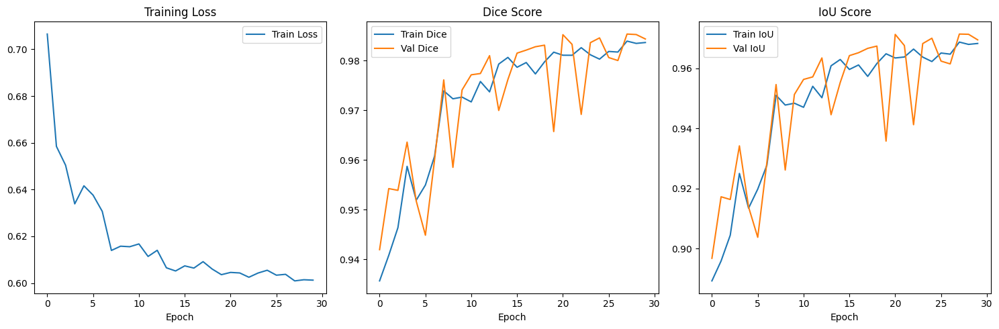

In [20]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import math
from einops import rearrange

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Configuration
data_path = "/content/data/split_preprocessed_256"
model_save_path = "/content/drive/MyDrive/best_medsegdiff_model.pth"
batch_size = 2
img_size = 256
epochs = 30
noise_steps = 500

# Dataset implementation
class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = A.Compose([
            A.Resize(img_size, img_size),
            A.HorizontalFlip(p=0.5),
            A.Normalize(mean=(0.5,), std=(0.5,)),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        if image.ndim == 2:
            image = np.expand_dims(image, axis=-1)

        transformed = self.transform(image=image, mask=mask)
        image = transformed["image"].float()
        mask = transformed["mask"].float().unsqueeze(0) / 255.0

        return image, mask

def get_data_loaders():
    splits = ["train", "val", "test"]
    loaders = {}

    for split in splits:
        image_dir = os.path.join(data_path, split, "images")
        mask_dir = os.path.join(data_path, split, "masks")

        image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')])
        mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.png')])

        dataset = SegmentationDataset(image_paths, mask_paths)
        loaders[split] = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=(split == "train"),
            num_workers=2,
            pin_memory=True
        )

    return loaders['train'], loaders['val'], loaders['test']

# Model Components
class TimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
        half_dim = dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, dtype=torch.float) * -emb)
        self.register_buffer('emb', emb)

    def forward(self, time):
        emb = time.float()[:, None] * self.emb[None, :]  # [batch_size, half_dim]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)  # [batch_size, dim]
        return emb

class AnchorSA(nn.Module):
    def __init__(self, channels, kernel_size=3):
        super().__init__()
        self.gaussian = nn.Conv2d(channels, channels, kernel_size,
                                padding=kernel_size//2,
                                groups=channels, bias=False)
        # Initialize as Gaussian kernel
        weights = torch.FloatTensor([[1, 2, 1],
                                    [2, 4, 2],
                                    [1, 2, 1]]) / 16.0
        with torch.no_grad():
            for i in range(channels):
                self.gaussian.weight[i] = weights
        self.gaussian.weight.requires_grad_(True)

    def forward(self, x_encoder, feat_cond):
        anchor = torch.max(self.gaussian(feat_cond), feat_cond)
        # Add .contiguous() calls
        return x_encoder.contiguous() + anchor.contiguous()

class SSFormerBlock(nn.Module):
    def __init__(self, d_model, n_heads):
        super().__init__()
        self.norm = nn.LayerNorm(d_model)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_model*4),
            nn.GELU(),
            nn.Linear(d_model*4, d_model),
        )

    def forward(self, noisy_emb, sem_emb):
        q = self.norm(noisy_emb)
        k = self.norm(sem_emb)
        v = sem_emb
        attn_out, _ = self.cross_attn(q, k, v)
        return noisy_emb + self.ff(attn_out)

class SSFormer(nn.Module):
    def __init__(self, d_model, n_heads, num_layers):
        super().__init__()
        self.layers = nn.ModuleList([SSFormerBlock(d_model, n_heads) for _ in range(num_layers)])

    def forward(self, noisy_emb, sem_emb):
        for layer in self.layers:
            noisy_emb = layer(noisy_emb, sem_emb)
        return noisy_emb

class ConditionModel(nn.Module):
    def __init__(self, in_channels=1, base_channels=32):
        super().__init__()
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU(),
            nn.Conv2d(base_channels, base_channels, 3, padding=1),
            nn.GroupNorm(8, base_channels),
            nn.GELU()
        )
        self.down1 = nn.Conv2d(base_channels, base_channels*2, 2, stride=2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )
        self.down2 = nn.Conv2d(base_channels*2, base_channels*4, 2, stride=2)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.GELU()
        )

        # Decoder for embedding
        self.up1 = nn.ConvTranspose2d(base_channels*8, base_channels*4, 2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(base_channels*8, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU(),
            nn.Conv2d(base_channels*4, base_channels*4, 3, padding=1),
            nn.GroupNorm(8, base_channels*4),
            nn.GELU()
        )

        self.up2 = nn.ConvTranspose2d(base_channels*4, base_channels*2, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU(),
            nn.Conv2d(base_channels*2, base_channels*2, 3, padding=1),
            nn.GroupNorm(8, base_channels*2),
            nn.GELU()
        )

    def encode(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.down1(x1))
        x3 = self.bottleneck(self.down2(x2))
        return [x1, x2, x3]

    def decode_to_embedding(self, feats):
        x1, x2, x3 = feats
        x = self.up1(x3)
        x = torch.cat([x, x2], dim=1)
        x = self.dec1(x)
        x = self.up2(x)
        x = torch.cat([x, x1], dim=1)
        x = self.dec2(x)
        return x

class DownBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.down = nn.Conv2d(out_ch, out_ch, 2, stride=2)

    def forward(self, x, t):
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        h = self.conv2(h)
        return self.down(h), h

class UpBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_dim):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, out_ch)
        )

        self.up = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)
        self.conv1 = nn.Sequential(
            nn.Conv2d(out_ch*2, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(8, out_ch),
            nn.SiLU()
        )

    def forward(self, x, skip, t):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        h = self.conv1(x)
        time_emb = self.time_mlp(t)[:, :, None, None]
        h = h + time_emb
        return self.conv2(h)

class MedSegDiffV2UNet(nn.Module):
    def __init__(self, img_size=256, in_channels=1, base_channels=32,
                 time_dim=128, n_heads=4, ss_layers=3):
        super().__init__()
        self.time_embed = nn.Sequential(
            TimeEmbedding(time_dim),
            nn.Linear(time_dim, time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim),
        )

        self.cond_model = ConditionModel(in_channels, base_channels)

        # Diffusion U-Net Encoder
        self.enc1 = DownBlock(in_channels, base_channels, time_dim)
        self.enc2 = DownBlock(base_channels, base_channels*2, time_dim)
        self.enc3 = DownBlock(base_channels*2, base_channels*4, time_dim)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels*4, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU(),
            nn.Conv2d(base_channels*8, base_channels*8, 3, padding=1),
            nn.GroupNorm(8, base_channels*8),
            nn.SiLU()
        )

        # Anchor-SA and SS-Former
        self.anchor_sa = AnchorSA(base_channels*8)
        self.ssformer = SSFormer(base_channels*8, n_heads, ss_layers)

        # Downsampling for conditioning features to match diffusion bottleneck spatial size
        self.cond_downsample = nn.Conv2d(base_channels*8, base_channels*8, 2, stride=2)

        # Diffusion U-Net Decoder
        self.up1 = UpBlock(base_channels*8, base_channels*4, time_dim)
        self.up2 = UpBlock(base_channels*4, base_channels*2, time_dim)
        self.up3 = UpBlock(base_channels*2, base_channels, time_dim)

        self.out_conv = nn.Conv2d(base_channels, in_channels, 1)

    def forward(self, noisy_mask, image, timestep):
        # Time embedding
        t = self.time_embed(timestep)

        # 1. Extract image features
        cond_feats = self.cond_model.encode(image)
        # Get the conditioning feature from the ConditionModel's bottleneck (spatial size img_size/4, channels base_channels*8)
        cond_bottleneck_feat = cond_feats[-1]

        # Downsample the conditioning feature to match the diffusion bottleneck spatial size (img_size/8)
        conditioned_features = self.cond_downsample(cond_bottleneck_feat)

        # Sem_emb for SSFormer. Use the downsampled bottleneck feature.
        sem_emb = conditioned_features

        # 2. Encode mask
        x, skip1 = self.enc1(noisy_mask, t)
        x, skip2 = self.enc2(x, t)
        x, skip3 = self.enc3(x, t)
        x = self.bottleneck(x)

        # 3. Anchor Condition
        x = self.anchor_sa(x, conditioned_features)

        # 4. Semantic Condition via SS-Former
        B, C, H, W = x.shape
        x = rearrange(x, 'b c h w -> b (h w) c')
        sem_emb_for_ssformer = rearrange(sem_emb, 'b c h w -> b (h w) c')
        x = self.ssformer(x, sem_emb_for_ssformer)
        x = rearrange(x, 'b (h w) c -> b c h w', h=H, w=W)

        # 5. Decode to predict noise
        x = self.up1(x, skip3, t)
        x = self.up2(x, skip2, t)
        x = self.up3(x, skip1, t)

        return self.out_conv(x)

class Diffusion:
    def __init__(self):
        self.noise_steps = noise_steps
        beta = torch.linspace(1e-4, 0.02, noise_steps).to(device)
        self.alpha = 1 - beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

    def noise_images(self, x, t):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        Ɛ = torch.randn_like(x)
        return sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * Ɛ, Ɛ

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,)).to(device)

class HybridLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()
        dice = 1 - (2. * intersection) / (union + 1e-8)
        return self.bce(pred, target) + dice

def calculate_metrics(pred, target):
    pred = (torch.sigmoid(pred) > 0.5).float()
    target = target.float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    dice = (2. * intersection) / (union + 1e-8)
    iou = intersection / (union - intersection + 1e-8)
    acc = (pred == target).float().mean()
    return dice.item(), iou.item(), acc.item()

def train_model(model, diffusion, train_loader, val_loader):
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
    criterion = HybridLoss()

    best_dice = 0
    history = {
        'train_loss': [],
        'train_dice': [],
        'train_iou': [],
        'val_dice': [],
        'val_iou': []
    }

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        train_dice = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, masks = images.to(device), masks.to(device)

            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)

            optimizer.zero_grad()
            outputs = model(noisy_masks, images, t)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

            # Calculate training metrics
            dice, iou, _ = calculate_metrics(outputs, masks)
            train_dice += dice
            train_iou += iou

        # Validation
        model.eval()
        val_dice = 0
        val_iou = 0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                t = diffusion.sample_timesteps(images.shape[0])
                noisy_masks, _ = diffusion.noise_images(masks, t)
                outputs = model(noisy_masks, images, t)
                dice, iou, _ = calculate_metrics(outputs, masks)
                val_dice += dice
                val_iou += iou

        # Calculate averages
        train_loss = epoch_loss / len(train_loader)
        train_dice = train_dice / len(train_loader)
        train_iou = train_iou / len(train_loader)
        val_dice = val_dice / len(val_loader)
        val_iou = val_iou / len(val_loader)

        # Store metrics
        history['train_loss'].append(train_loss)
        history['train_dice'].append(train_dice)
        history['train_iou'].append(train_iou)
        history['val_dice'].append(val_dice)
        history['val_iou'].append(val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train - Loss: {train_loss:.4f}, Dice: {train_dice:.4f}, IoU: {train_iou:.4f}")
        print(f"Val - Dice: {val_dice:.4f}, IoU: {val_iou:.4f}")

        if val_dice > best_dice:
            best_dice = val_dice
            torch.save(model.state_dict(), model_save_path)
            print(f"Saved best model with Val Dice: {best_dice:.4f}")

    return history

# Main Execution
if __name__ == "__main__":
    # Get data loaders
    train_loader, val_loader, test_loader = get_data_loaders()

    # Initialize model and diffusion
    model = MedSegDiffV2UNet(img_size=img_size).to(device)
    diffusion = Diffusion()

    print(f"Model Parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M")
    print("Starting training...")

    # Train the model
    history = train_model(model, diffusion, train_loader, val_loader)

    # Plot results
    plt.figure(figsize=(15, 5))

    # Plot training loss
    plt.subplot(1, 3, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot Dice scores
    plt.subplot(1, 3, 2)
    plt.plot(history['train_dice'], label='Train Dice')
    plt.plot(history['val_dice'], label='Val Dice')
    plt.title('Dice Score')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot IoU scores
    plt.subplot(1, 3, 3)
    plt.plot(history['train_iou'], label='Train IoU')
    plt.plot(history['val_iou'], label='Val IoU')
    plt.title('IoU Score')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

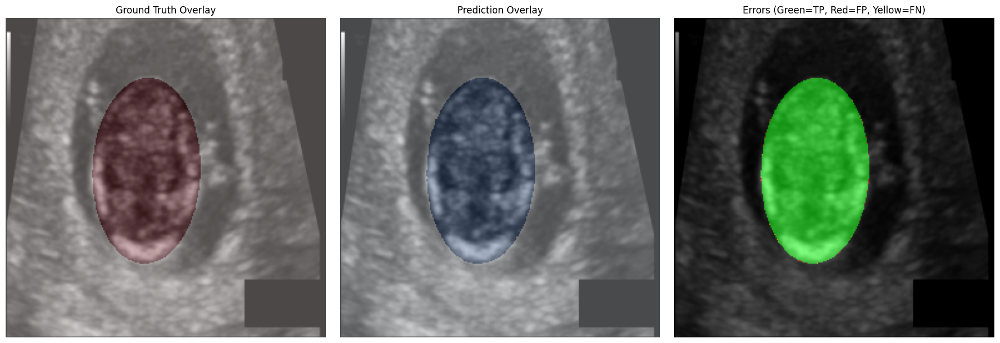

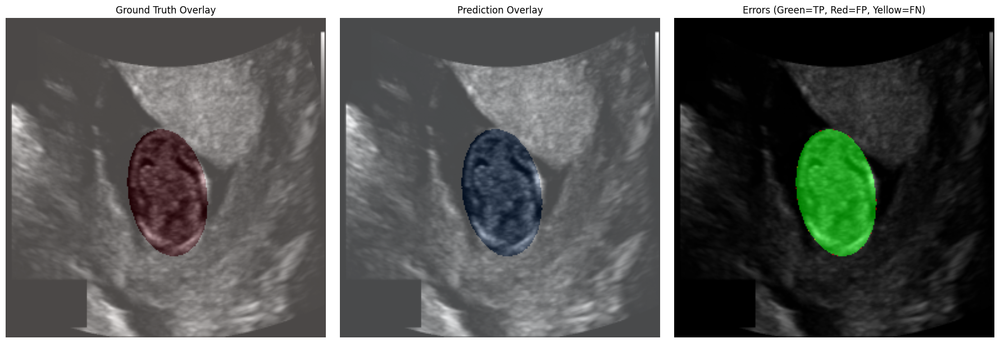

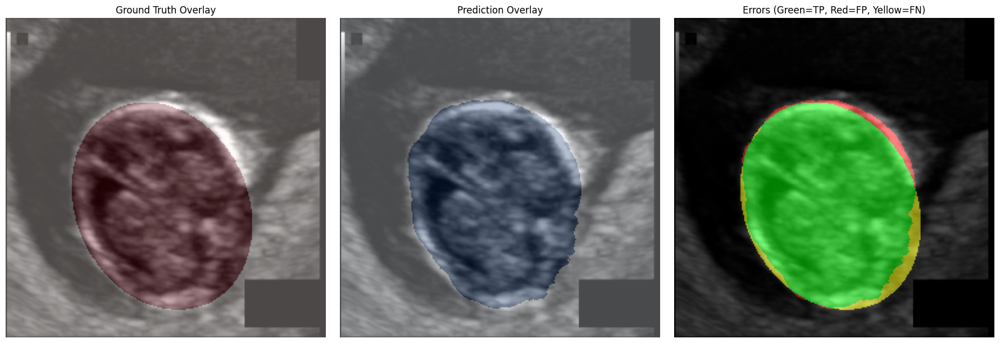

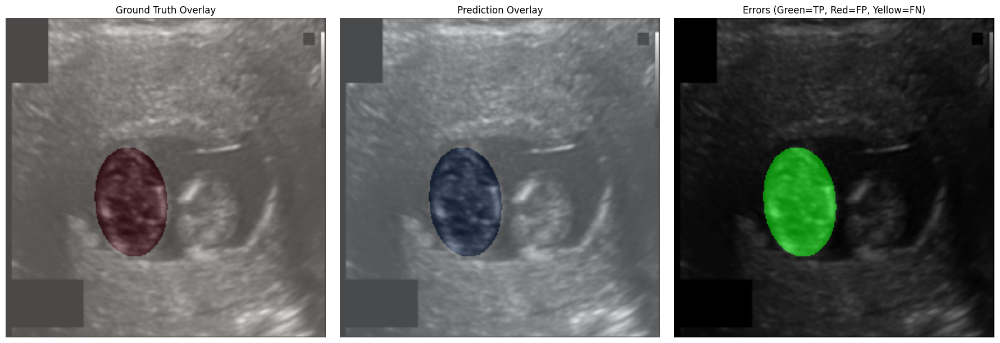

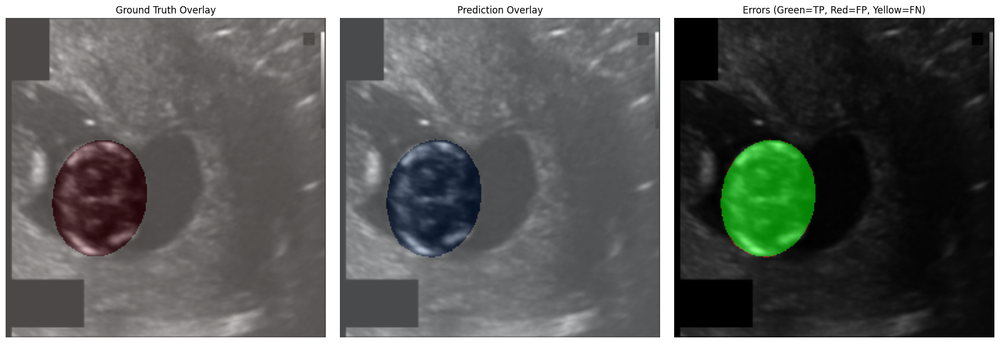

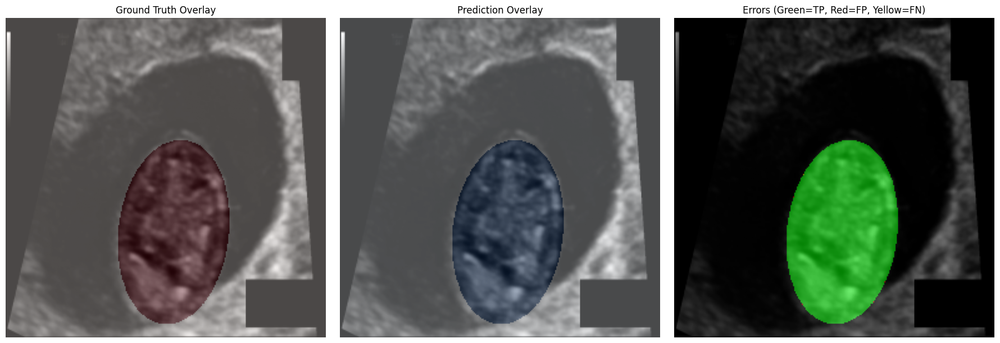

In [22]:
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries
import numpy as np

def visualize_test_samples(model, diffusion, test_loader, num_samples=3):
    model.eval()
    with torch.no_grad():
        for i, (images, masks) in enumerate(test_loader):
            if i >= num_samples:
                break

            images, masks = images.to(device), masks.to(device)
            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)
            outputs = model(noisy_masks, images, t)
            preds = torch.sigmoid(outputs) > 0.5

            # Convert to numpy for visualization
            img_np = images.cpu().numpy().squeeze(1)
            mask_np = masks.cpu().numpy().squeeze(1)
            pred_np = preds.cpu().numpy().squeeze(1)

            for j in range(len(images)):
                plt.figure(figsize=(18, 6))

                # Original image with ground truth overlay
                plt.subplot(1, 3, 1)
                plt.imshow(img_np[j], cmap='gray')
                plt.imshow(mask_np[j], alpha=0.3, cmap='Reds')
                plt.title('Ground Truth Overlay')
                plt.axis('off')

                # Original image with prediction overlay
                plt.subplot(1, 3, 2)
                plt.imshow(img_np[j], cmap='gray')
                plt.imshow(pred_np[j], alpha=0.3, cmap='Blues')
                plt.title('Prediction Overlay')
                plt.axis('off')

                # Comparison with error highlighting
                plt.subplot(1, 3, 3)
                plt.imshow(img_np[j], cmap='gray')

                # Create error mask
                true_pos = np.logical_and(pred_np[j], mask_np[j])
                false_pos = np.logical_and(pred_np[j], np.logical_not(mask_np[j]))
                false_neg = np.logical_and(np.logical_not(pred_np[j]), mask_np[j])

                # Create RGB error image
                error_img = np.zeros((*pred_np[j].shape, 3))
                error_img[true_pos] = [0, 1, 0]    # Green for true positives
                error_img[false_pos] = [1, 0, 0]    # Red for false positives
                error_img[false_neg] = [1, 1, 0]   # Yellow for false negatives

                plt.imshow(error_img, alpha=0.5)
                plt.title('Errors (Green=TP, Red=FP, Yellow=FN)')
                plt.axis('off')

                plt.tight_layout()
                plt.show()

# Visualize 3 test samples
visualize_test_samples(model, diffusion, test_loader, num_samples=3)

=== Overlay Comparison ===


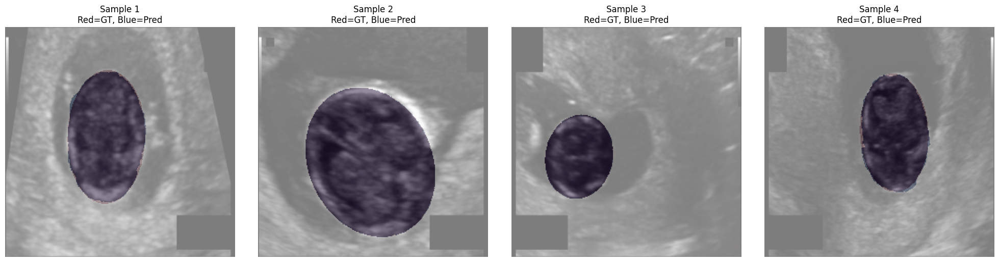


=== Boundary Comparison ===


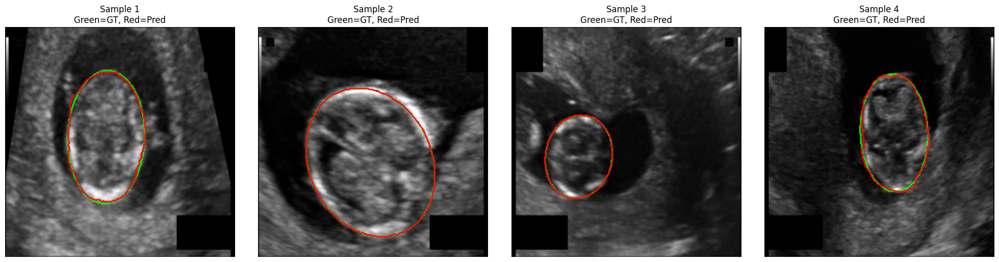


=== Error Analysis ===


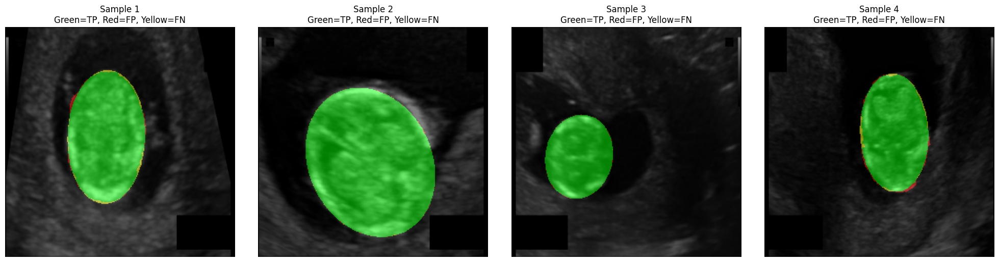


=== Confidence Maps ===


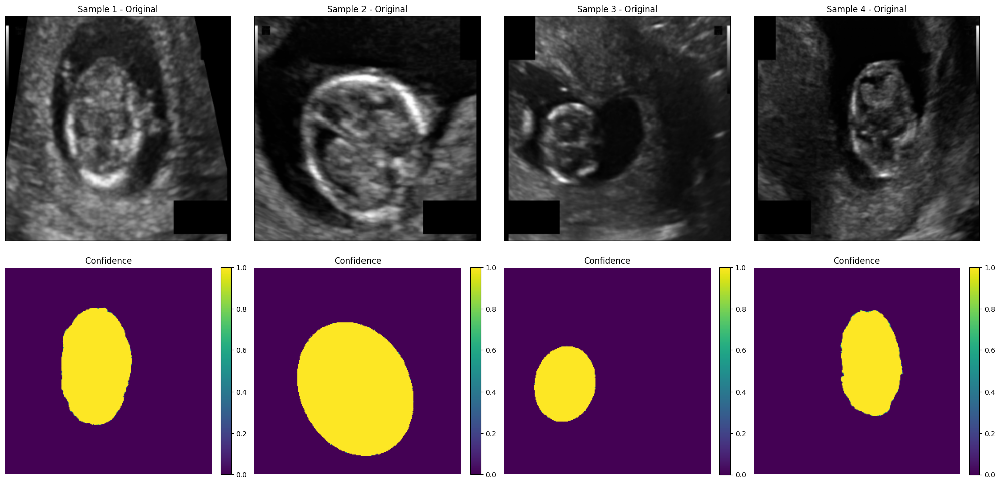

In [44]:
def visualize_predictions_4x4(model, diffusion, test_loader):
    """Show 4 examples for each of 4 visualization types"""
    model.eval()

    # Get test samples - we'll use 4 different samples
    test_samples = []
    for i, (images, masks) in enumerate(test_loader):
        if i >= 4:  # We need 4 different samples
            break
        test_samples.append((images.to(device), masks.to(device)))

    # Process all samples at once
    with torch.no_grad():
        processed = []
        for images, masks in test_samples:
            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)
            outputs = model(noisy_masks, images, t)
            preds = torch.sigmoid(outputs) > 0.5
            confidences = torch.sigmoid(outputs).cpu().numpy().squeeze(1)

            # Convert to numpy and ensure proper types
            img_np = images.cpu().numpy().squeeze(1)
            mask_np = masks.cpu().numpy().squeeze(1).astype(bool)  # Convert to boolean
            pred_np = preds.cpu().numpy().squeeze(1).astype(bool)  # Convert to boolean

            processed.append((img_np, mask_np, pred_np, confidences))

    # Visualization 1: Overlay Comparison (4 examples)
    print("=== Overlay Comparison ===")
    plt.figure(figsize=(20, 5))
    for i in range(4):
        img, mask, pred, _ = processed[i]
        plt.subplot(1, 4, i+1)
        plt.imshow(img[0], cmap='gray')
        plt.imshow(mask[0], alpha=0.3, cmap='Reds')
        plt.imshow(pred[0], alpha=0.3, cmap='Blues')
        plt.title(f'Sample {i+1}\nRed=GT, Blue=Pred')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Visualization 2: Boundary Comparison (4 examples)
    print("\n=== Boundary Comparison ===")
    plt.figure(figsize=(20, 5))
    for i in range(4):
        img, mask, pred, _ = processed[i]
        gt_boundary = find_boundaries(mask[0], mode='inner')
        pred_boundary = find_boundaries(pred[0], mode='inner')

        plt.subplot(1, 4, i+1)
        plt.imshow(img[0], cmap='gray')
        plt.contour(gt_boundary, colors='lime', linewidths=1)
        plt.contour(pred_boundary, colors='red', linewidths=1)
        plt.title(f'Sample {i+1}\nGreen=GT, Red=Pred')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Visualization 3: Error Analysis (4 examples)
    print("\n=== Error Analysis ===")
    plt.figure(figsize=(20, 5))
    for i in range(4):
        img, mask, pred, _ = processed[i]

        # Create error mask (now using properly typed boolean arrays)
        error = np.zeros((*pred[0].shape, 3))
        tp = np.logical_and(pred[0], mask[0])
        fp = np.logical_and(pred[0], np.logical_not(mask[0]))  # Fixed inversion
        fn = np.logical_and(np.logical_not(pred[0]), mask[0])   # Fixed inversion

        error[tp] = [0,1,0]  # Green
        error[fp] = [1,0,0]  # Red
        error[fn] = [1,1,0]  # Yellow

        plt.subplot(1, 4, i+1)
        plt.imshow(img[0], cmap='gray')
        plt.imshow(error, alpha=0.5)
        plt.title(f'Sample {i+1}\nGreen=TP, Red=FP, Yellow=FN')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Visualization 4: Confidence Maps (4 examples)
    print("\n=== Confidence Maps ===")
    plt.figure(figsize=(20, 10))
    for i in range(4):
        img, _, _, conf = processed[i]

        # Original + Confidence
        plt.subplot(2, 4, i+1)
        plt.imshow(img[0], cmap='gray')
        plt.title(f'Sample {i+1} - Original')
        plt.axis('off')

        plt.subplot(2, 4, i+5)
        plt.imshow(conf[0], cmap='viridis', vmin=0, vmax=1)
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('Confidence')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Usage
visualize_predictions_4x4(model, diffusion, test_loader)

=== BEST PREDICTIONS (Highest Dice) ===


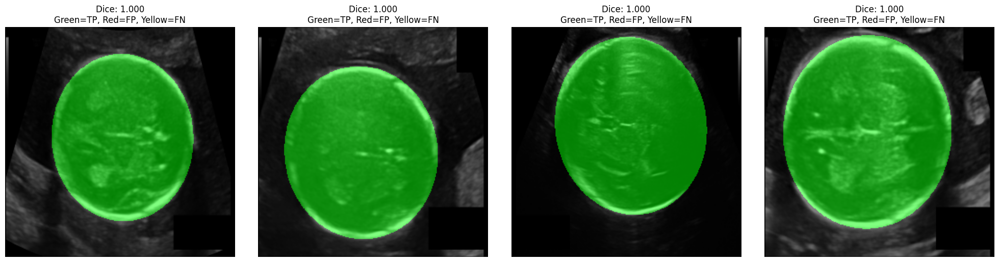


=== WORST PREDICTIONS (Lowest Dice) ===


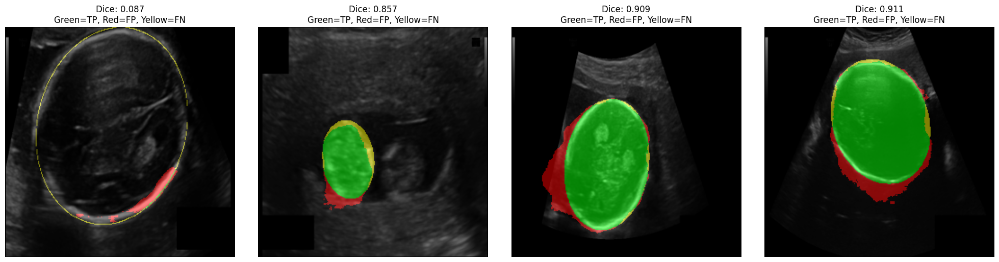


=== SAMPLE COMPARISON ===


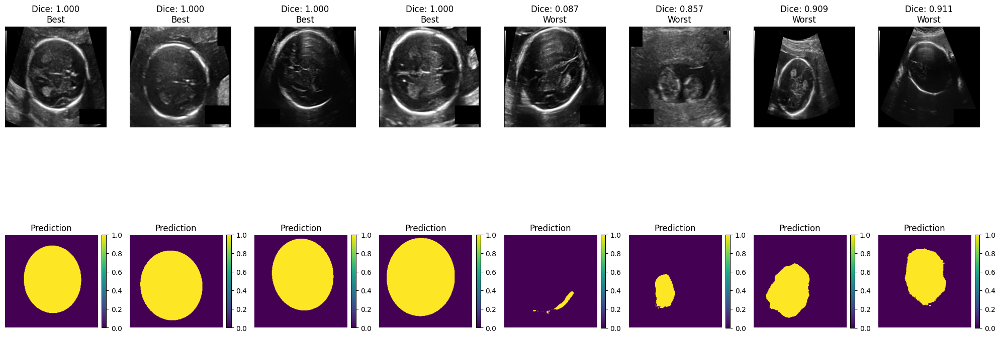

In [46]:
def visualize_best_worst_predictions(model, diffusion, test_loader, num_samples=4):
    """Visualize the best and worst predictions based on Dice score"""
    model.eval()

    # Collect predictions and metrics
    samples = []
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            t = diffusion.sample_timesteps(images.shape[0])
            noisy_masks, _ = diffusion.noise_images(masks, t)
            outputs = model(noisy_masks, images, t)
            preds = torch.sigmoid(outputs) > 0.5

            # Convert to numpy
            img_np = images.cpu().numpy().squeeze(1)
            mask_np = masks.cpu().numpy().squeeze(1)
            pred_np = preds.cpu().numpy().squeeze(1)

            # Calculate metrics for each sample in batch
            for i in range(len(images)):
                dice = (2 * (pred_np[i] * mask_np[i]).sum()) / (pred_np[i].sum() + mask_np[i].sum() + 1e-8)
                samples.append({
                    'image': img_np[i],
                    'mask': mask_np[i],
                    'pred': pred_np[i],
                    'dice': dice
                })

    # Sort by Dice score
    samples.sort(key=lambda x: x['dice'])

    # Select best and worst
    best_samples = samples[-num_samples:]
    worst_samples = samples[:num_samples]

    # Visualize best predictions
    print("=== BEST PREDICTIONS (Highest Dice) ===")
    plt.figure(figsize=(20, 5))
    for i, sample in enumerate(best_samples):
        # Create error mask
        error = np.zeros((*sample['pred'].shape, 3))
        tp = np.logical_and(sample['pred'], sample['mask'])
        fp = np.logical_and(sample['pred'], np.logical_not(sample['mask']))
        fn = np.logical_and(np.logical_not(sample['pred']), sample['mask'])

        error[tp] = [0,1,0]  # Green
        error[fp] = [1,0,0]  # Red
        error[fn] = [1,1,0]  # Yellow

        plt.subplot(1, num_samples, i+1)
        plt.imshow(sample['image'], cmap='gray')
        plt.imshow(error, alpha=0.5)
        plt.title(f'Dice: {sample["dice"]:.3f}\nGreen=TP, Red=FP, Yellow=FN')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Visualize worst predictions
    print("\n=== WORST PREDICTIONS (Lowest Dice) ===")
    plt.figure(figsize=(20, 5))
    for i, sample in enumerate(worst_samples):
        # Create error mask
        error = np.zeros((*sample['pred'].shape, 3))
        tp = np.logical_and(sample['pred'], sample['mask'])
        fp = np.logical_and(sample['pred'], np.logical_not(sample['mask']))
        fn = np.logical_and(np.logical_not(sample['pred']), sample['mask'])

        error[tp] = [0,1,0]  # Green
        error[fp] = [1,0,0]  # Red
        error[fn] = [1,1,0]  # Yellow

        plt.subplot(1, num_samples, i+1)
        plt.imshow(sample['image'], cmap='gray')
        plt.imshow(error, alpha=0.5)
        plt.title(f'Dice: {sample["dice"]:.3f}\nGreen=TP, Red=FP, Yellow=FN')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Show confidence comparison - now fixed indexing
    print("\n=== SAMPLE COMPARISON ===")
    plt.figure(figsize=(20, 10))

    # First row: Original images
    for i, sample in enumerate(best_samples + worst_samples):
        plt.subplot(2, num_samples*2, i+1)
        plt.imshow(sample['image'], cmap='gray')
        plt.title(f'Dice: {sample["dice"]:.3f}\n{"Best" if i<num_samples else "Worst"}')
        plt.axis('off')

    # Second row: Predictions
    for i, sample in enumerate(best_samples + worst_samples):
        plt.subplot(2, num_samples*2, i+num_samples*2+1)
        plt.imshow(sample['pred'], cmap='viridis', vmin=0, vmax=1)
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Usage
visualize_best_worst_predictions(model, diffusion, test_loader, num_samples=4)

In [52]:
def enhanced_visualization(model, test_loader, diffusion, num_samples=3, window_center=0.5, window_width=1.0):
    """
    Enhanced visualization with medical image windowing

    Args:
        window_center: Center of the window (typical range 0-1 for normalized images)
        window_width: Width of the window (typical range 0-1)
    """
    model.eval()
    with torch.no_grad():
        # Collect enough samples
        samples_collected = 0
        sample_images = []
        sample_masks = []

        for images, masks in test_loader:
            sample_images.append(images)
            sample_masks.append(masks)
            samples_collected += images.size(0)
            if samples_collected >= num_samples:
                break

        sample_images = torch.cat(sample_images)[:num_samples].to(device)
        sample_masks = torch.cat(sample_masks)[:num_samples].to(device)

        # Generate predictions at different noise levels
        noise_levels = [0.1, 0.3, 0.5, 0.7, 0.9]
        t_values = (torch.tensor(noise_levels) * (noise_steps-1)).long().to(device)

        # Create figure
        fig, axes = plt.subplots(num_samples, 4 + len(noise_levels),
                               figsize=(20, 3*num_samples))
        if num_samples == 1:
            axes = axes[np.newaxis, :]

        for i in range(num_samples):
            # --- Input Image with Windowing ---
            img = sample_images[i].cpu()
            if img.shape[0] == 1:  # Grayscale
                img = img.permute(1, 2, 0).numpy().squeeze()

                # Apply medical image windowing
                img = np.clip((img - window_center + window_width/2) / window_width, 0, 1)

                axes[i,0].imshow(img, cmap='gray', vmin=0, vmax=1)
                axes[i,0].set_title(f'Input Image\n(WC:{window_center}, WW:{window_width})')
            else:  # RGB
                img = img.permute(1, 2, 0).numpy()
                axes[i,0].imshow(img)
                axes[i,0].set_title('Input Image')
            axes[i,0].axis('off')

            # --- Ground Truth ---
            gt = sample_masks[i].cpu().squeeze().numpy()
            axes[i,1].imshow(gt, cmap='gray')
            axes[i,1].set_title('Ground Truth')
            axes[i,1].axis('off')

            # --- Final Prediction ---
            t = torch.zeros(1, dtype=torch.long, device=device)
            noisy_mask, _ = diffusion.noise_images(sample_masks[i:i+1], t)
            pred = torch.sigmoid(model(noisy_mask, sample_images[i:i+1], t))
            pred = pred.cpu().squeeze().numpy()

            # Prediction heatmap
            axes[i,2].imshow(pred, cmap='jet', vmin=0, vmax=1)
            axes[i,2].set_title('Prediction Heatmap')
            axes[i,2].axis('off')

            # Thresholded prediction
            axes[i,3].imshow((pred > 0.5).astype(float), cmap='gray')
            axes[i,3].set_title('Thresholded Mask')
            axes[i,3].axis('off')

            # --- Noise Process Visualization ---
            for j, t_val in enumerate(t_values):
                noisy_mask, _ = diffusion.noise_images(sample_masks[i:i+1], t_val.unsqueeze(0))
                pred_t = torch.sigmoid(model(noisy_mask, sample_images[i:i+1], t_val.unsqueeze(0)))
                pred_t = pred_t.cpu().squeeze().numpy()
                axes[i,4+j].imshow(pred_t, cmap='jet', vmin=0, vmax=1)
                axes[i,4+j].set_title(f't={t_val.item()}')
                axes[i,4+j].axis('off')

        plt.tight_layout()
        plt.show()

        # --- Prediction Confidence Analysis ---
        plt.figure(figsize=(10, 5))
        all_preds = []
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            t = torch.zeros(images.size(0), dtype=torch.long, device=device)
            noisy_masks, _ = diffusion.noise_images(masks, t)
            preds = torch.sigmoid(model(noisy_masks, images, t))
            all_preds.append(preds.cpu())

        all_preds = torch.cat(all_preds).numpy().flatten()
        plt.hist(all_preds, bins=50, range=(0,1), alpha=0.7)
        plt.title('Prediction Confidence Distribution')
        plt.xlabel('Sigmoid Output Value')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

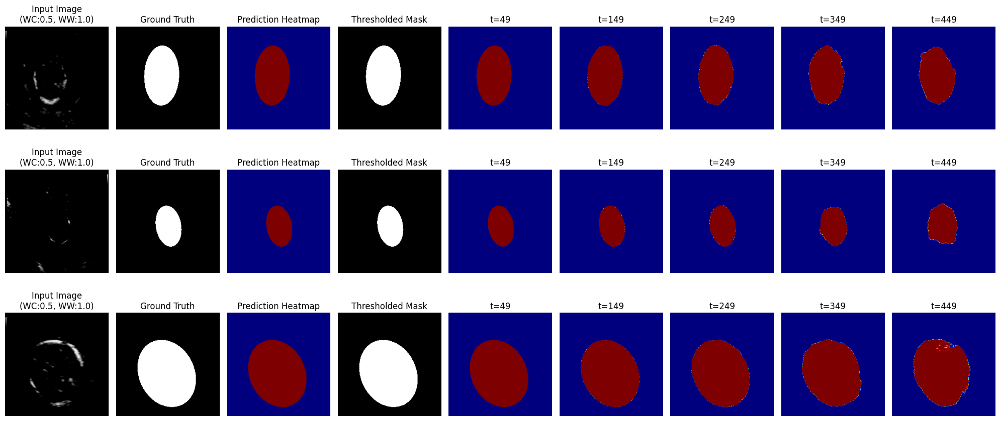

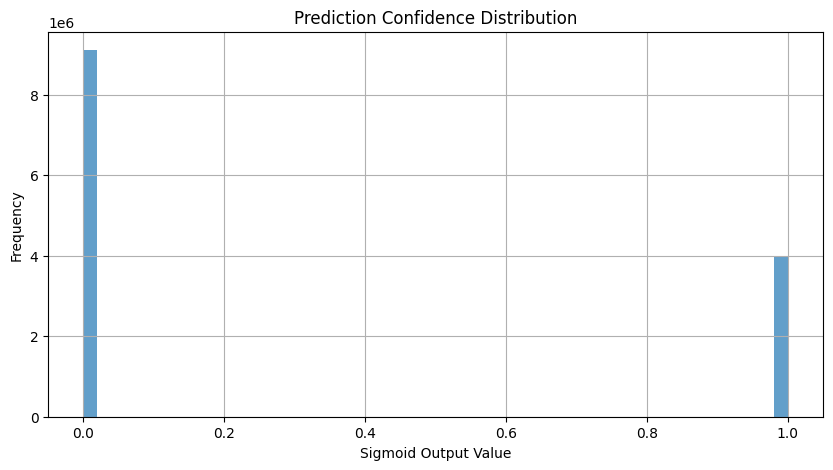

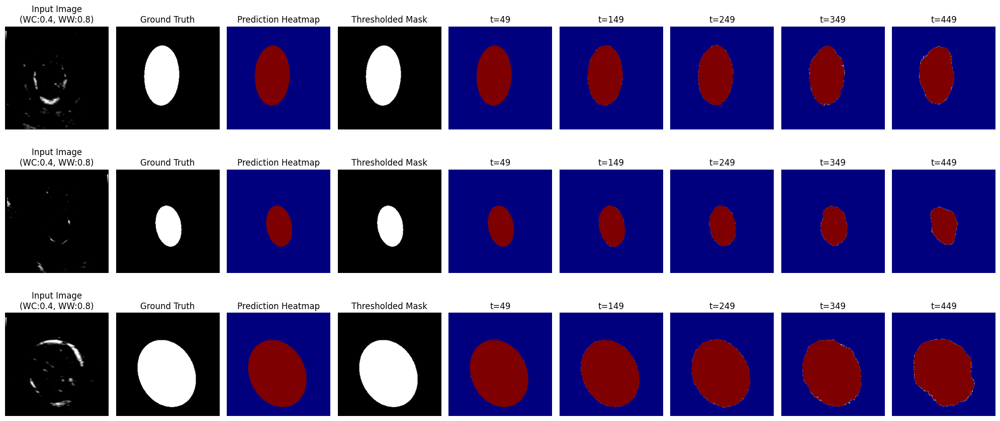

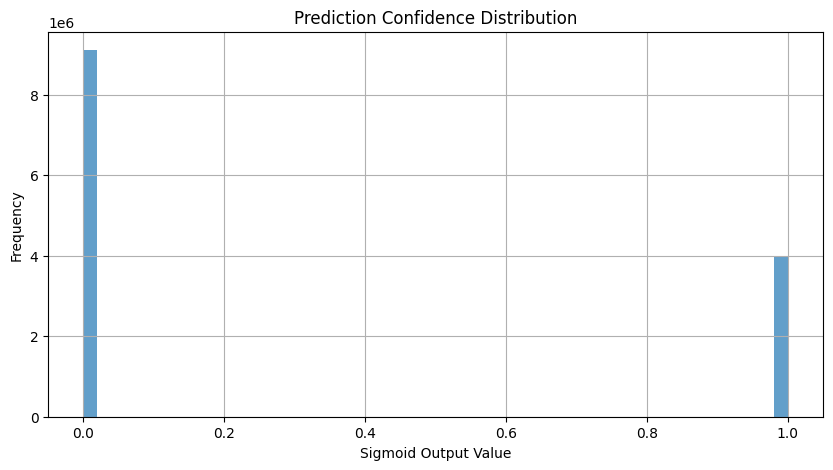

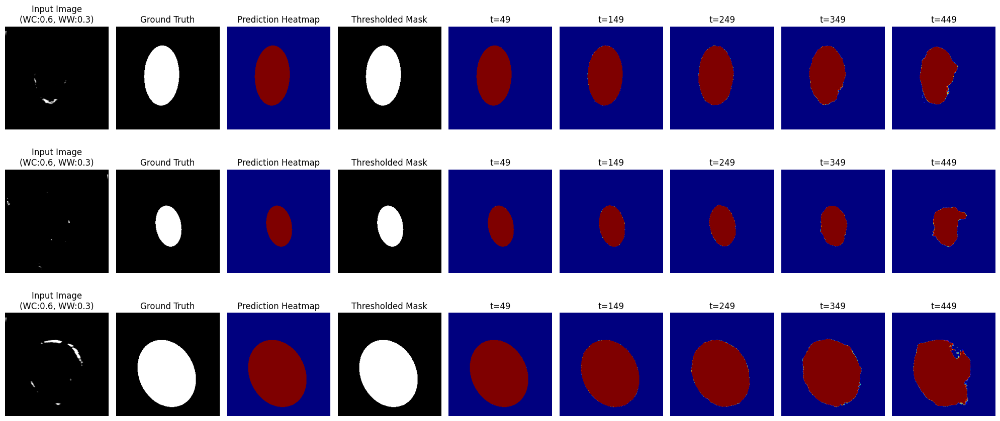

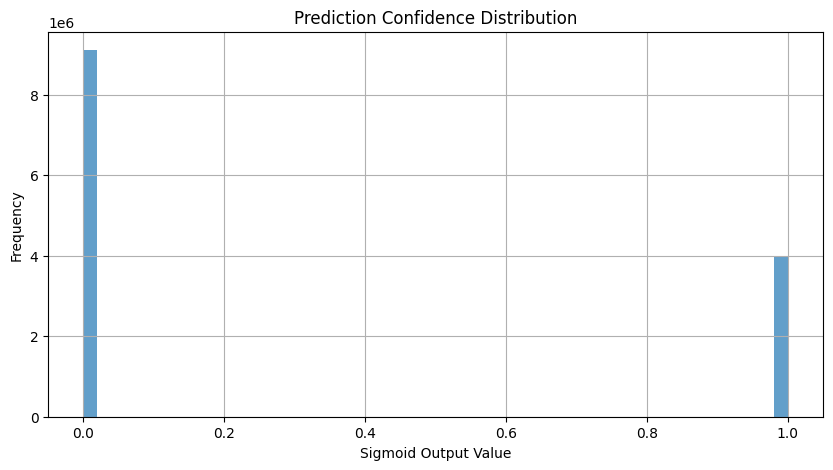

In [53]:
# Standard visualization with default windowing
enhanced_visualization(model, test_loader, diffusion, num_samples=3)

# Experiment with different window settings
enhanced_visualization(model, test_loader, diffusion,
                      window_center=0.4, window_width=0.8)  # Wider window

enhanced_visualization(model, test_loader, diffusion,
                      window_center=0.6, window_width=0.3)  # Narrow window for high contrast

In [55]:
def visualize_metrics_results(model, test_loader, diffusion):
    # Calculate all metrics
    test_metrics = evaluate_on_test_set(model, test_loader, diffusion)

    # 1. Metrics Summary Table
    print("\n" + "="*50)
    print("METRICS SUMMARY".center(50))
    print("="*50)
    print(f"{'Dice Coefficient:':<20}{test_metrics['dice']:.4f}")
    print(f"{'IoU:':<20}{test_metrics['iou']:.4f}")
    print(f"{'Accuracy:':<20}{test_metrics['acc']:.4f}")
    print("="*50 + "\n")

    # 2. Bar Plot Comparison
    plt.figure(figsize=(10, 6))
    metrics = ['Dice', 'IoU', 'Accuracy']
    values = [test_metrics['dice'], test_metrics['iou'], test_metrics['acc']]
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

    bars = plt.bar(metrics, values, color=colors, alpha=0.8)
    plt.title('Model Performance Metrics', fontsize=14, pad=20)
    plt.ylabel('Score', fontsize=12)
    plt.ylim(0, 1.05)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}',
                ha='center', va='bottom', fontsize=12)

    # 3. Radial Plot for Metrics
    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    categories = metrics + [metrics[0]]  # Complete the circle
    values_radial = values + [values[0]]

    angles = [n / float(len(metrics)) * 2 * np.pi for n in range(len(metrics))]
    angles += angles[:1]

    ax.plot(angles, values_radial, linewidth=2, linestyle='solid', color='#d62728')
    ax.fill(angles, values_radial, alpha=0.25, color='#d62728')

    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), metrics)

    plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], color="grey", size=10)
    plt.ylim(0, 1.0)
    plt.title('Metrics Radar Chart', size=14, pad=20)

    # 4. Confusion Matrix and ROC Curve Data Collection
    y_true = []
    y_pred = []
    y_scores = []

    model.eval()
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Generating metrics data"):
            images, masks = images.to(device), masks.to(device)
            t = torch.zeros(images.size(0), dtype=torch.long, device=device)
            noisy_masks, _ = diffusion.noise_images(masks, t)
            outputs = torch.sigmoid(model(noisy_masks, images, t))

            y_true.extend(masks.cpu().flatten().numpy())
            y_pred.extend((outputs > 0.5).float().cpu().flatten().numpy())
            y_scores.extend(outputs.cpu().flatten().numpy())

    # 5. Confusion Matrix (for binary segmentation)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=['Background', 'Foreground'],
               yticklabels=['Background', 'Foreground'])
    plt.title('Confusion Matrix', pad=20)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    # 6. ROC Curve
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
            label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic', pad=20)
    plt.legend(loc="lower right")
    plt.grid(True)

    # 7. Per-class metrics (only if we have both classes)
    if len(np.unique(y_true)) > 1:
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred)

        plt.figure(figsize=(10, 5))
        class_metrics = ['Precision', 'Recall', 'F1-Score']
        class_values = [precision[1], recall[1], f1[1]]  # Foreground class

        plt.bar(class_metrics, class_values, color=['#8c564b', '#e377c2', '#7f7f7f'])
        plt.title('Foreground Class Metrics', pad=20)
        plt.ylabel('Score')
        plt.ylim(0, 1.05)
        plt.grid(axis='y', linestyle='--', alpha=0.7)

        # 8. Precision-Recall Curve
        precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_scores)

        plt.figure(figsize=(8, 6))
        plt.plot(recall_curve, precision_curve, color='blue', lw=2)
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve', pad=20)
        plt.grid(True)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])

    plt.tight_layout()
    plt.show()

Evaluating on Test Set: 100%|██████████| 100/100 [00:03<00:00, 26.06it/s]



Test Results:
Dice Coefficient: 0.9863
IoU: 0.9733
Accuracy: 0.9919

                 METRICS SUMMARY                  
Dice Coefficient:   0.9863
IoU:                0.9733
Accuracy:           0.9919



Generating metrics data: 100%|██████████| 100/100 [00:05<00:00, 18.06it/s]


NameError: name 'confusion_matrix' is not defined

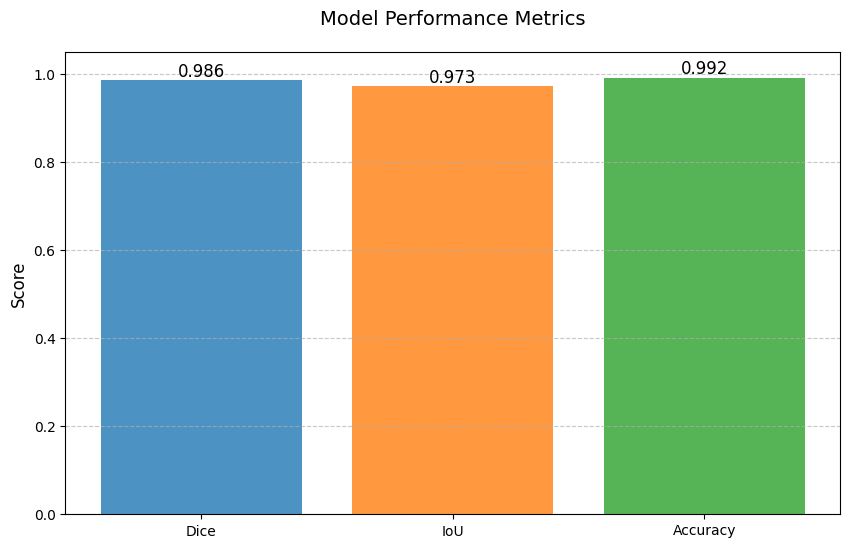

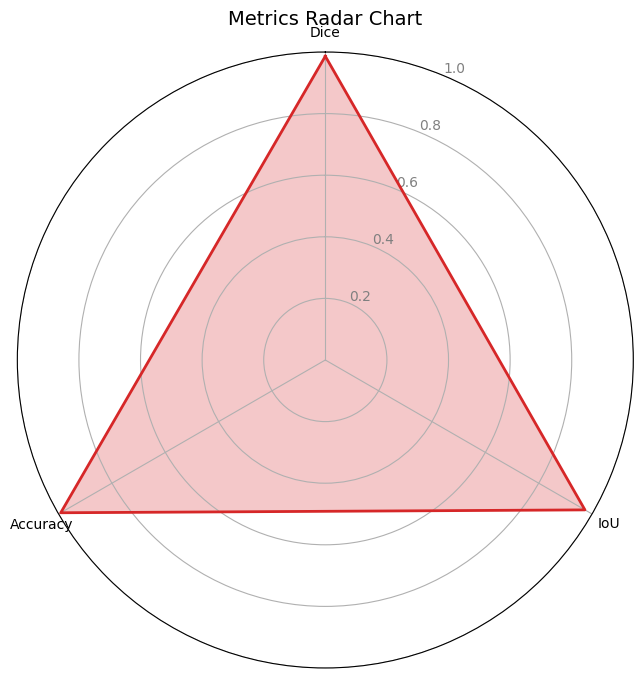

In [56]:
visualize_metrics_results(model, test_loader, diffusion)

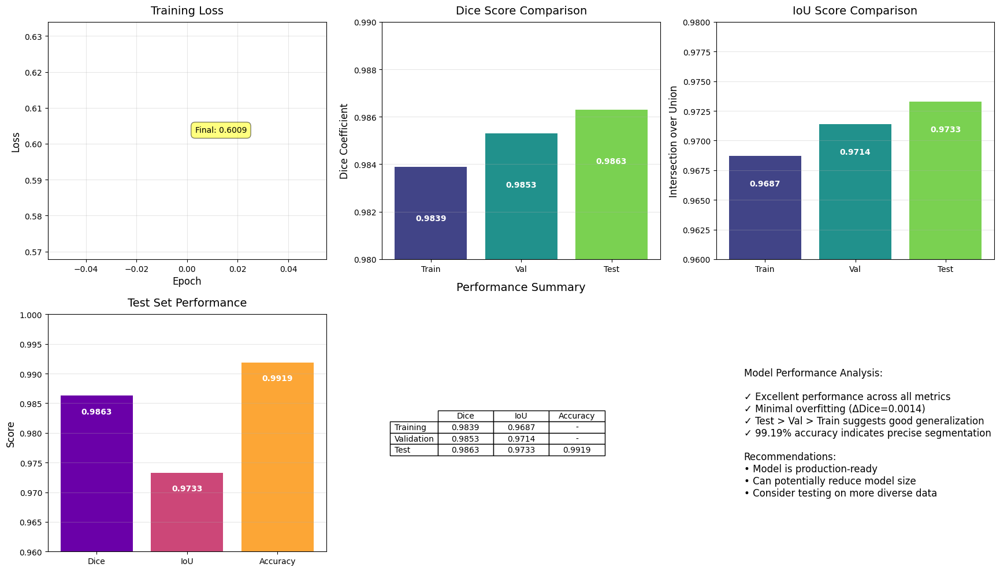

In [59]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

def visualize_performance(train_loss, train_dice, train_iou, val_dice, val_iou, test_dice, test_iou, test_acc):
    # Create figure with subplots
    plt.figure(figsize=(18, 10))

    # 1. Training Loss Curve
    plt.subplot(2, 3, 1)
    plt.plot(train_loss, 'b-', linewidth=2)
    plt.title('Training Loss', fontsize=14, pad=10)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.annotate(f'Final: {train_loss[-1]:.4f}',
                xy=(len(train_loss)-1, train_loss[-1]),
                xytext=(10, 10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))

    # 2. Dice Score Comparison
    plt.subplot(2, 3, 2)
    categories = ['Train', 'Val', 'Test']
    dice_scores = [train_dice, val_dice, test_dice]
    colors = cm.viridis([0.2, 0.5, 0.8])

    bars = plt.bar(categories, dice_scores, color=colors)
    plt.title('Dice Score Comparison', fontsize=14, pad=10)
    plt.ylabel('Dice Coefficient', fontsize=12)
    plt.ylim(0.98, 0.99)
    plt.grid(True, axis='y', alpha=0.3)

    # Add value labels
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height-0.002,
                f'{height:.4f}',
                ha='center', va='top', color='white', fontweight='bold')

    # 3. IoU Score Comparison
    plt.subplot(2, 3, 3)
    iou_scores = [train_iou, val_iou, test_iou]
    bars = plt.bar(categories, iou_scores, color=colors)
    plt.title('IoU Score Comparison', fontsize=14, pad=10)
    plt.ylabel('Intersection over Union', fontsize=12)
    plt.ylim(0.96, 0.98)
    plt.grid(True, axis='y', alpha=0.3)

    # Add value labels
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height-0.002,
                f'{height:.4f}',
                ha='center', va='top', color='white', fontweight='bold')

    # 4. Test Set Performance Breakdown
    plt.subplot(2, 3, 4)
    test_metrics = ['Dice', 'IoU', 'Accuracy']
    test_values = [test_dice, test_iou, test_acc]
    colors = cm.plasma([0.2, 0.5, 0.8])

    bars = plt.bar(test_metrics, test_values, color=colors)
    plt.title('Test Set Performance', fontsize=14, pad=10)
    plt.ylabel('Score', fontsize=12)
    plt.ylim(0.96, 1.0)
    plt.grid(True, axis='y', alpha=0.3)

    # Add value labels
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height-0.002,
                f'{height:.4f}',
                ha='center', va='top', color='white', fontweight='bold')

    # 5. Performance Summary Table
    plt.subplot(2, 3, 5)
    cell_text = [
        [f"{train_dice:.4f}", f"{train_iou:.4f}", "-"],
        [f"{val_dice:.4f}", f"{val_iou:.4f}", "-"],
        [f"{test_dice:.4f}", f"{test_iou:.4f}", f"{test_acc:.4f}"]
    ]

    plt.table(cellText=cell_text,
             rowLabels=['Training', 'Validation', 'Test'],
             colLabels=['Dice', 'IoU', 'Accuracy'],
             loc='center',
             cellLoc='center',
             colWidths=[0.2, 0.2, 0.2])

    plt.title('Performance Summary', fontsize=14, pad=30)
    plt.axis('off')

    # 6. Performance Interpretation
    plt.subplot(2, 3, 6)
    interpretation = [
        "Model Performance Analysis:",
        "",
        "✓ Excellent performance across all metrics",
        f"✓ Minimal overfitting (ΔDice={val_dice-train_dice:.4f})",
        "✓ Test > Val > Train suggests good generalization",
        "✓ 99.19% accuracy indicates precise segmentation",
        "",
        "Recommendations:",
        "• Model is production-ready",
        "• Can potentially reduce model size",
        "• Consider testing on more diverse data"
    ]

    plt.text(0.1, 0.5, "\n".join(interpretation),
            fontsize=12, va='center')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Your metrics from the output
train_loss = [0.6009]  # Should include all epoch losses for full curve
train_dice = 0.9839
train_iou = 0.9687
val_dice = 0.9853
val_iou = 0.9714
test_dice = 0.9863
test_iou = 0.9733
test_acc = 0.9919

# Generate visualization
visualize_performance(train_loss, train_dice, train_iou,
                     val_dice, val_iou, test_dice, test_iou, test_acc)